# Project 2 figures
Run the first two code cells, then the desired figure cell. Change `figsize` in that cell and fonts in the settings below. PDFs are saved here and copied to the thesis.

In [1]:
from pathlib import Path
import sys, shutil, re, csv, logging
from functools import lru_cache
import xml.etree.ElementTree as ET
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
from matplotlib.lines import Line2D
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import FancyBboxPatch
from matplotlib.transforms import IdentityTransform
import fitz, h5py, yaml

sys.dont_write_bytecode = True
HERE = Path.cwd()
if HERE.name.lower() != "figures_for_thesis":
    HERE = HERE / "figures_for_thesis"
ROOT = HERE.parent
THESIS = ROOT.parent / "PhD_thesis_20251216" / "figures_proj2"
sys.path.insert(0, str(ROOT))
from vmatplot.algorithms import fit_birch_murnaghan
from vmatplot.bandstructure import extract_kpath, kpoints_path_lists
from vmatplot.dos import _read_outcar_parameters, _read_outcar_eigen_matrices, _read_outcar_kpoint_weights
from vmatplot.phonon import extract_phonon_bands, extract_qpath
logging.getLogger("fontTools").setLevel(logging.ERROR)

plt.rcdefaults()
plt.rcParams.update({
    "font.family": "serif", "mathtext.fontset": "cm", "axes.titlesize": 24, "axes.titlepad": 12, "figure.titlesize": 24,
    "axes.labelsize": 18, "xtick.labelsize": 16, "ytick.labelsize": 16,
    "legend.fontsize": 12, "figure.dpi": 196, "figure.facecolor": "white",
    "lines.linewidth": 1.5, "xtick.direction": "in", "ytick.direction": "in",
    "xtick.top": True, "ytick.right": True, "pdf.fonttype": 42, "path.simplify": False,
})

BLUE, GREEN, VIOLET, GREY, ORANGE, RED = "#1478E1", "#28AF3C", "#8C64E1", "#787878", "#FA8C00", "#C82364"
YELLOW, CYAN, OLIVE = "#FAC828", "#32B4C8", "#8CAF28"
FERMI = "#643CC3"
TAB = {"boxstyle": "round,pad=0.2", "facecolor": "white", "edgecolor": "#B4B4B4", "alpha": .75, "linewidth": 1.5}
head_fontsize = 16

def title(ax, text, size=head_fontsize, pad=head_fontsize / 2):
    ax.annotate(text, xy=(0, 1), xycoords="axes fraction", xytext=(pad, -pad), textcoords="offset points",
                va="top", ha="left", fontsize=size, bbox=TAB, zorder=10)

def headroom(ax, fraction=.15):  # space above the data for the tab and legend
    low, high = ax.get_ylim()
    ax.set_ylim(low, high + fraction * (high - low))

class LegendFrame(FancyBboxPatch):  # follows the axes box at draw time, rounded like a legend of `size` pt
    def draw(self, renderer):
        box = self.axes.get_window_extent(renderer)
        self.set_bounds(box.x0, box.y0, box.width, box.height)
        self.set_mutation_scale(renderer.points_to_pixels(self.size))
        super().draw(renderer)

def legend_frame(ax, size=plt.rcParams["legend.fontsize"]):  # replace the spines by the default legend frame
    ax.spines[:].set_visible(False)
    frame = LegendFrame((0, 0), 1, 1, boxstyle="round,pad=0,rounding_size=0.2", transform=IdentityTransform(),
                        facecolor="none", edgecolor=plt.rcParams["legend.edgecolor"], alpha=plt.rcParams["legend.framealpha"],
                        linewidth=1, clip_on=False, in_layout=False, zorder=10)
    frame.size = size
    ax.add_artist(frame)

def suptitle(fig, text, rect=(0, 0, 1, 1)):  # tight layout; baseline one title pad above the axes and any top x axis
    t = fig.suptitle(text, va="baseline")
    fig.tight_layout(rect=rect)
    renderer = fig.canvas.get_renderer()
    top = max(ax.xaxis.get_tightbbox(renderer).y1 if ax.xaxis.get_label_position() == "top" else ax.get_window_extent().y1
              for ax in fig.axes)
    t.set_y(top / fig.bbox.height + plt.rcParams["axes.titlepad"] / 72 / fig.get_figheight())

def save(fig, name):
    fig.savefig(HERE / name, metadata={"CreationDate": None})
    shutil.copyfile(HERE / name, THESIS / name)
    display(fig)
    plt.close(fig)

In [2]:
SPIN = [Line2D([], [], color=VIOLET, label="Spin up"), Line2D([], [], color=CYAN, ls=(0, (4, 3)), label="Spin down")]
FERMI_LINE = Line2D([], [], color=FERMI, ls="--", label="Fermi energy")
QPATH = [r"$\Gamma$", "Z", "T", "Y", r"$\Gamma$"]
HBAR, C = 6.582119569e-16, 2.99792458e18  # eV s, Å/s
# Optical systems: folder, label, colour, supercell height / effective thickness.
SYSTEMS = [("bilayer_with_Hydrogen", "H-terminated bilayer", ORANGE, 30.088116646 / 11.208620),
           ("bilayer", "Bilayer", YELLOW, 28.088116646 / 9.41157),
           ("monolayer", "Monolayer", GREEN, 24.044058323 / 5.807056948202938),
           ("o-B14_n128_k34", "Bulk", BLUE, 1.)]
OPTICAL = {"alpha": "Absorption coefficient", "loss": "Energy-loss spectrum", "R": "Reflectivity",
           "n": "Refractive index", "k": "Extinction coefficient"}
PRISTINE = [("3.0_phonon_dispersion_vasp/monolayer_3", "Monolayer", CYAN),
            ("3.0_phonon_dispersion_vasp/bilayer_3", "Bilayer", YELLOW)]
HYDROGEN = [("3.0_phonon_dispersion_phononpy/monolayer_top", "H-terminated monolayer", OLIVE),
            ("3.0_phonon_dispersion_phononpy/bilayer_top", "H-terminated bilayer", ORANGE)]

@lru_cache(None)
def bands(folder):  # k distance, energies per spin (k x band), tick positions and labels, path breaks
    path = ROOT / "3.1_bandstructure" / folder
    root = ET.parse(path / "vasprun.xml").getroot()
    if (path / "KPOINTS_OPT").exists():
        eigen = root.find("./calculation/eigenvalues_kpoints_opt/eigenvalues")
        fermi = float(root.find("./calculation/dos[@comment='kpoints_opt']/i[@name='efermi']").text)
    else:
        eigen = root.find("./calculation/eigenvalues")
        fermi = float(root.find(".//i[@name='efermi']").text)
    energies = [np.array([[float(r.text.split()[0]) for r in k.findall("r")] for k in spin.findall("set")]) - fermi
                for spin in eigen.findall("./array/set/set")]
    x, breaks = extract_kpath(str(path), return_breaks=True)
    ticks, labels = kpoints_path_lists(str(path))
    return np.array(x), energies, ticks, labels, breaks

def draw_bands(ax, folder, spin=False, color=BLUE, label=None):
    x, energies, ticks, labels, breaks = bands(folder)
    for channel, values in enumerate(energies if spin else energies[:1]):
        xx, yy = x.copy(), values.copy()
        for i in reversed(breaks):  # gaps at discontinuities of the k path
            xx, yy = np.insert(xx, i, xx[i]), np.insert(yy, i, np.nan, axis=0)
        lines = ax.plot(xx, yy, color=(VIOLET, CYAN)[channel] if spin else color, ls=("-", (0, (4, 3)))[channel] if spin else "-")
        if label:
            lines[0].set_label(label)
    for tick in ticks[1:-1]:
        ax.axvline(tick, color=GREY, ls="--", zorder=0)
    ax.axhline(0, color=FERMI, ls="--", zorder=0)
    ax.set(xticks=ticks, xticklabels=labels, xlim=(x[0], x[-1]), ylim=(-4, 3))

@lru_cache(None)
def dos(folder):  # energy relative to the Fermi level, DOS per spin
    path = ROOT / "4.1_PDoS" / folder
    if folder.endswith("_ollie"):  # both spin channels rebuilt on one grid from the OUTCAR eigenvalues (0.05 eV Gaussians)
        lines = (path / "OUTCAR").read_text().splitlines()
        params = _read_outcar_parameters(lines)
        eigen, _ = _read_outcar_eigen_matrices(lines)
        weights = np.asarray(_read_outcar_kpoint_weights(lines, 25))
        sigma = params["sigma"]
        energy = np.linspace(min(a.min() for a in eigen.values()) - 6 * sigma,
                             max(a.max() for a in eigen.values()) + 6 * sigma, params["nedos"])
        channels = [np.exp(-.5 * ((energy[:, None, None] - eigen[spin]) / sigma)**2).sum(axis=1) @ weights
                    / (sigma * np.sqrt(2 * np.pi)) for spin in (1, 2)]
        return energy - params["efermi"], channels
    section = ET.parse(path / "vasprun.xml").getroot().find(".//dos")
    fermi = float(section.find("i[@name='efermi']").text)
    arrays = [np.array([r.text.split() for r in spin.findall("r")], float) for spin in section.findall("./total/array/set/set")]
    return arrays[0][:, 0] - fermi, [a[:, 1] for a in arrays]

@lru_cache(None)
def dielectric(folder, factor=1.):  # energies, rescaled real and imaginary diagonal components (energy x component)
    with h5py.File(ROOT / "5.1_dielectric_function" / folder / "vaspout.h5") as f:
        energy = f["results/linear_response/energies_dielectric_function"][:]
        tensor = f["results/linear_response/density_density_dielectric_function"][:]
    real = np.array([tensor[i, i, :, 0] for i in range(3)]).T
    imag = np.array([tensor[i, i, :, 1] for i in range(3)]).T
    return energy, 1 + factor * (real - 1), factor * imag

def optics(folder, factor, kind):
    energy, real, imag = dielectric(folder, factor)
    modulus = np.hypot(real, imag)
    n = np.sqrt(np.maximum(0, (modulus + real) / 2))
    k = np.sqrt(np.maximum(0, (modulus - real) / 2))
    return energy, {"real": real, "imag": imag, "n": n, "k": k, "alpha": 2 * energy[:, None] * k / (HBAR * C),
                    "loss": imag / (real**2 + imag**2), "R": ((n - 1)**2 + k**2) / ((n + 1)**2 + k**2)}[kind]

def optical(name, kind):
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    for col, (ax, component) in enumerate(zip(axes.flat, ["xx", "yy", "zz"])):
        for folder, label, color, factor in SYSTEMS:
            energy, values = optics(folder, factor, kind)
            ax.plot(energy[energy <= 12], values[energy <= 12, col], color=color, label=label)
        ax.set(xlim=(0, 12), ylim=(0, None), xlabel="Photon energy (eV)",
               ylabel=OPTICAL[kind] + (r" ($\mathrm{\AA}^{-1}$)" if kind == "alpha" else ""))
        headroom(ax)
        title(ax, component + "-component")
    axes[1, 1].axis("off")  # shared legend in the empty fourth cell
    axes[1, 1].legend(*axes[0, 0].get_legend_handles_labels(), loc="center", fontsize=22)
    suptitle(fig, OPTICAL[kind] + " for o-B$_{14}$ systems")
    save(fig, name)

def dielectric_panel(ax, heading, loc="upper right"):
    ax.axhline(0, color=GREY, ls="--", zorder=0)
    headroom(ax)
    title(ax, heading)
    ax.legend(loc=loc)
    ax.set(xlabel="Photon energy (eV)", ylabel="Dielectric function")

@lru_cache(None)
def phonon(folder):  # q distance with NaN gaps, frequencies (THz), tick positions
    path = ROOT / folder
    if (path / "band.yaml").exists():
        with open(path / "band.yaml") as f:
            raw = yaml.load(f, Loader=yaml.CSafeLoader)
        x = np.array([q["distance"] for q in raw["phonon"]])
        y = np.array([[b["frequency"] for b in q["band"]] for q in raw["phonon"]])
        ends = np.cumsum(raw["segment_nqpoint"])
        ticks = [x[0]]
        for end in ends:
            if x[end - 1] > ticks[-1] + 1e-10:
                ticks.append(x[end - 1])
        for end in reversed(ends[:-1]):
            x, y = np.insert(x, end, np.nan), np.insert(y, end, np.nan, axis=0)
        return x, y, ticks
    x = np.array(extract_qpath(str(path)))
    n = len(x) // 4
    return x, np.array(extract_phonon_bands(str(path))["bands"]).T, x[[0, n - 1, 2 * n - 1, 3 * n - 1, -1]]

def draw_phonon(ax, systems):  # systems: (folder, label, colour); path marks from the last one
    for folder, label, color in systems:
        x, y, ticks = phonon(folder)
        ax.plot(x, y, color=color)[0].set_label(label)
    for tick in ticks[1:-1]:
        ax.axvline(tick, color=GREY, ls="--", zorder=0)
    ax.axhline(0, color=GREY, ls="--", zorder=0)
    ax.set(xticks=ticks, xticklabels=QPATH, xlim=(np.nanmin(x), np.nanmax(x)), ylabel="Frequency (THz)")

def table(path):  # rows of a tab-separated table with lower-case keys
    with open(ROOT / path) as f:
        rows = list(csv.DictReader(f, delimiter="\t"))
    aliases = {"kpoints(x y z)": "kpoints mesh", "encut": "energy cutoff (encut)"}
    return [{aliases.get(k.lower(), k.lower()): v for k, v in row.items()} for row in rows]

def series(folder, x="total kpoints", y="total energy", lower=40, name="energy_parameters.dat"):
    rows = sorted((r for r in table(f"1.0_energy/o-B14/{folder}/{name}") if float(r[x]) >= lower), key=lambda r: float(r[x]))
    return np.array([float(r[x]) for r in rows]), np.array([float(r[y]) for r in rows]), rows

def mesh_index(rows):  # first integer of the k-point mesh
    return np.array([int(r["kpoints mesh"].strip("()").split(",")[0]) for r in rows])

### fig2.6 — HSE06 band structures

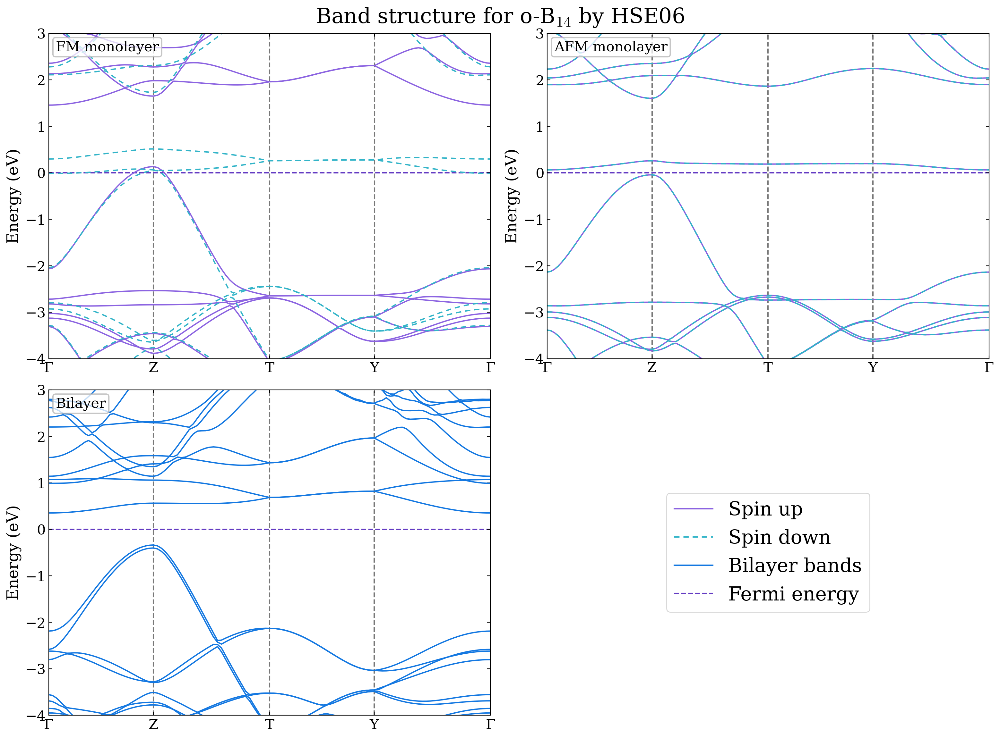

In [3]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
for ax, folder, heading in zip(axes.flat, ["monolayer_FM_HSE06", "monolayer_AFM_HSE06", "bilayer_HSE"],
                               ["FM monolayer", "AFM monolayer", "Bilayer"]):
    draw_bands(ax, folder, spin=folder != "bilayer_HSE")
    ax.set_ylabel("Energy (eV)")
    title(ax, heading)
axes[1, 1].axis("off")
axes[1, 1].legend(handles=SPIN + [Line2D([], [], color=BLUE, label="Bilayer bands"), FERMI_LINE], loc="center", fontsize=22)
suptitle(fig, "Band structure for o-B$_{14}$ by HSE06")
save(fig, "fig2.6.pdf")

### S2.11 — FM monolayer bands by GGA-PBE and HSE06

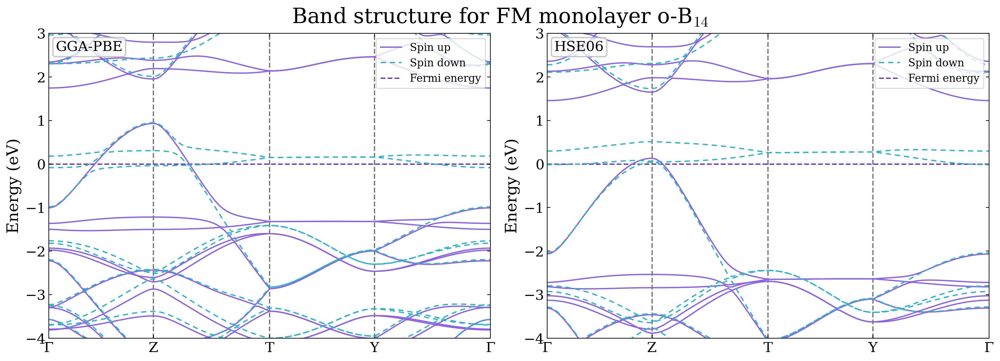

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, folder, method in zip(axes, ["monolayer_FM", "monolayer_FM_HSE06"], ["GGA-PBE", "HSE06"]):
    draw_bands(ax, folder, spin=True)
    ax.set_ylabel("Energy (eV)")
    title(ax, method)
    ax.legend(handles=SPIN + [FERMI_LINE], loc="upper right")
suptitle(fig, "Band structure for FM monolayer o-B$_{14}$")
save(fig, "S2.11.pdf")

### S2.13–14 — Monolayer band structures

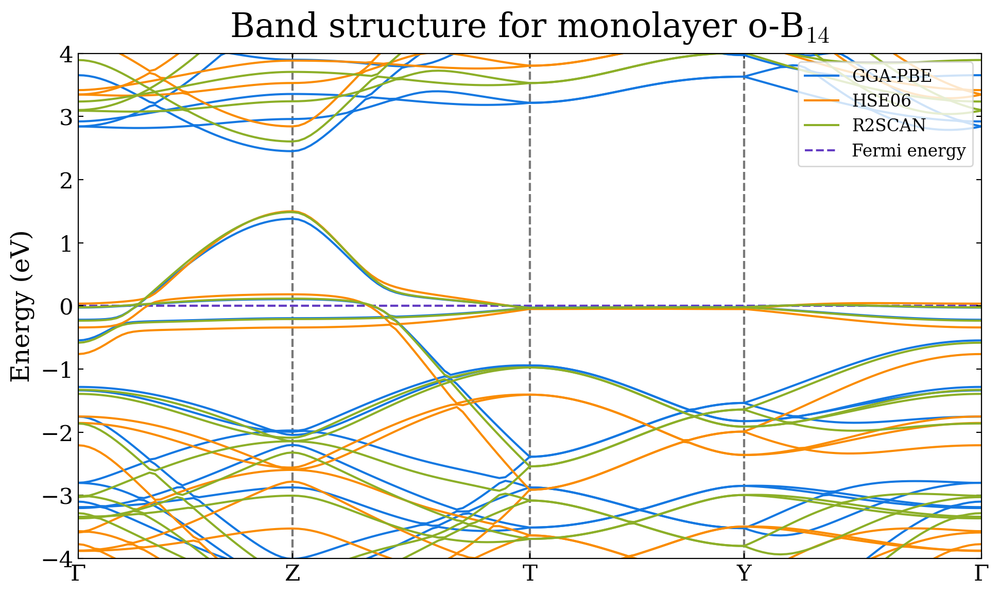

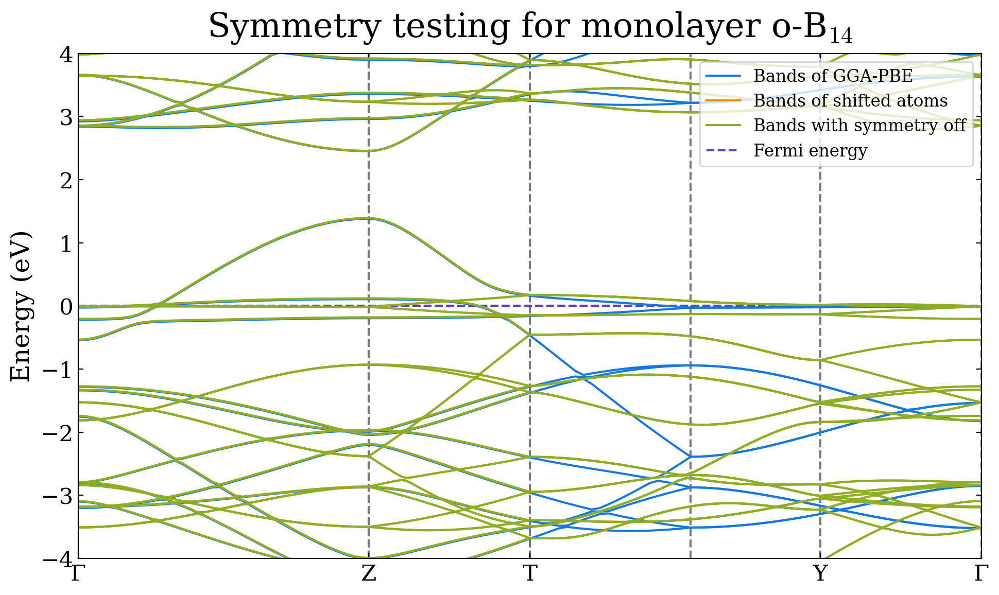

In [5]:
for name, folders, labels, heading in [
    ("S2.13.pdf", ["monolayer", "monolayer_HSE", "monolayer_R2SCAN"], ["GGA-PBE", "HSE06", "R2SCAN"],
     "Band structure for monolayer o-B$_{14}$"),
    ("S2.14.pdf", ["monolayer", "monolayer_shifting", "monolayer_sym_off"], ["Bands of GGA-PBE", "Bands of shifted atoms", "Bands with symmetry off"],
     "Symmetry testing for monolayer o-B$_{14}$"),
]:
    fig, ax = plt.subplots(figsize=(10, 6))
    for folder, label, color in zip(folders, labels, [BLUE, ORANGE, OLIVE]):
        draw_bands(ax, folder, color=color, label=label)
    ax.set(ylim=(-4, 4), ylabel="Energy (eV)", title=heading)
    ax.legend(handles=ax.get_legend_handles_labels()[0] + [FERMI_LINE], loc="upper right")
    fig.tight_layout()
    save(fig, name)

### S2.16 — Spin-polarized DoS of the monolayer

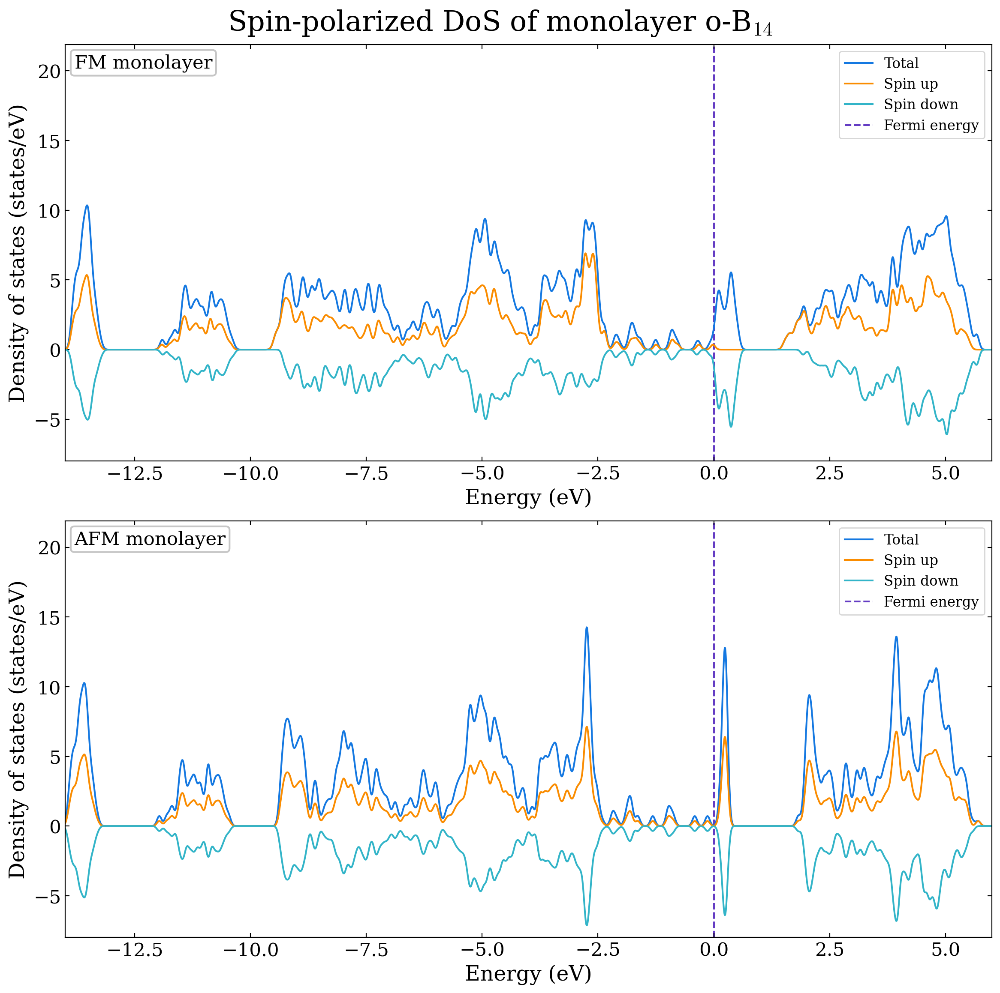

In [6]:
fig, axes = plt.subplots(2, 1, figsize=(12, 12))
for ax, folder, heading in zip(axes, ["monolayer_FM_ollie", "monolayer_AFM_ollie"], ["FM monolayer", "AFM monolayer"]):
    energy, (up, down) = dos(folder)
    ax.plot(energy, up + down, color=BLUE, label="Total")
    ax.plot(energy, up, color=ORANGE, label="Spin up")
    ax.plot(energy, -down, color=CYAN, label="Spin down")
    ax.axvline(0, color=FERMI, ls="--", zorder=0, label="Fermi energy")
    ax.set(xlim=(-14, 6), ylim=(-8, 15), xlabel="Energy (eV)", ylabel="Density of states (states/eV)")
    headroom(ax, .3)
    title(ax, heading)
    ax.legend(loc="upper right")
suptitle(fig, "Spin-polarized DoS of monolayer o-B$_{14}$")
save(fig, "S2.16.pdf")

### S2.12 — Total DoS

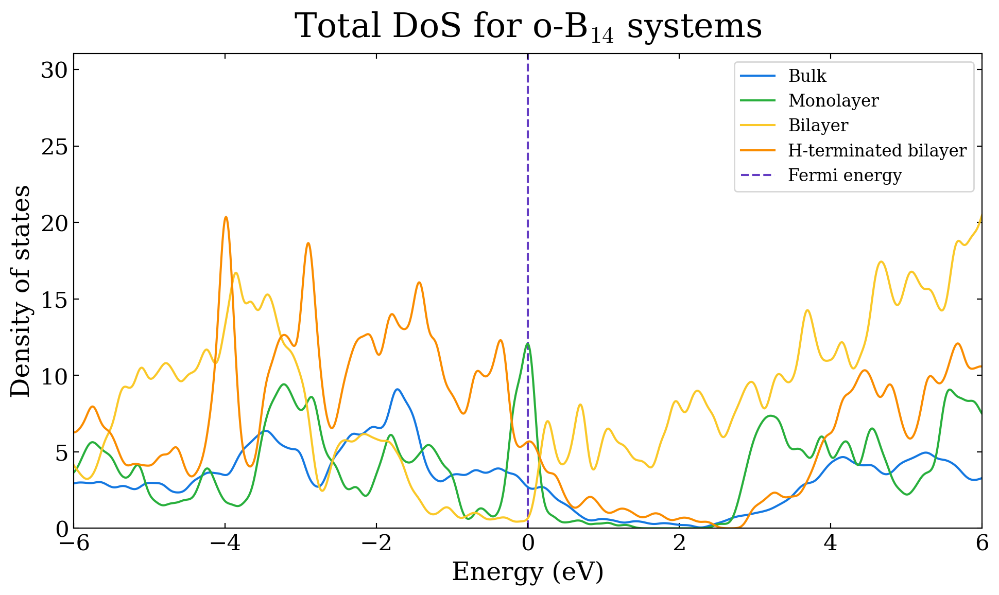

In [7]:
fig, ax = plt.subplots(figsize=(10, 6))
for folder, label, color in [("o-B14_K20", "Bulk", BLUE), ("monolayer", "Monolayer", GREEN),
                             ("bilayer", "Bilayer", YELLOW), ("bilayer_with_Hydrogen", "H-terminated bilayer", ORANGE)]:
    energy, channels = dos(folder)
    ax.plot(energy, channels[0], color=color, label=label)
ax.axvline(0, color=FERMI, ls="--", zorder=0, label="Fermi energy")
ax.set(xlim=(-6, 6), ylim=(0, 27), xlabel="Energy (eV)", ylabel="Density of states", title="Total DoS for o-B$_{14}$ systems")
headroom(ax)
ax.legend(loc="upper right")
fig.tight_layout()
save(fig, "S2.12.pdf")

### fig2.8 — Bands and DoS of the H-terminated bilayer

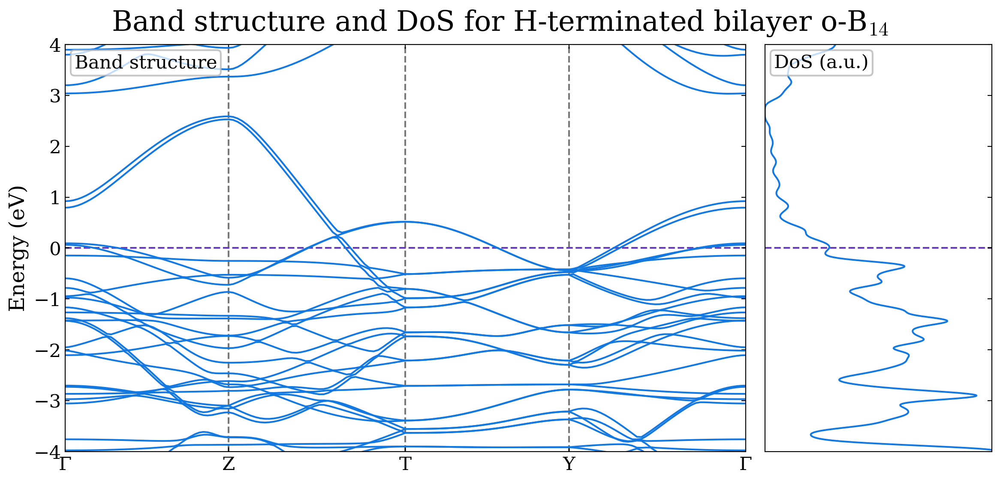

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True, gridspec_kw={"width_ratios": [3, 1]})
draw_bands(axes[0], "bilayer_with_Hydrogen")
energy, channels = dos("bilayer_with_Hydrogen")
axes[1].plot(channels[0], energy, color=BLUE)
axes[0].set(ylim=(-4, 4), ylabel="Energy (eV)")
axes[1].set(xlim=(0, 20), xticks=[])
axes[1].tick_params(left=False, labelleft=False)
axes[1].axhline(0, color=FERMI, ls="--", zorder=0)
title(axes[0], "Band structure")
title(axes[1], "DoS (a.u.)")
suptitle(fig, "Band structure and DoS for H-terminated bilayer o-B$_{14}$")
save(fig, "fig2.8.pdf")

### fig2.10 — Dielectric function

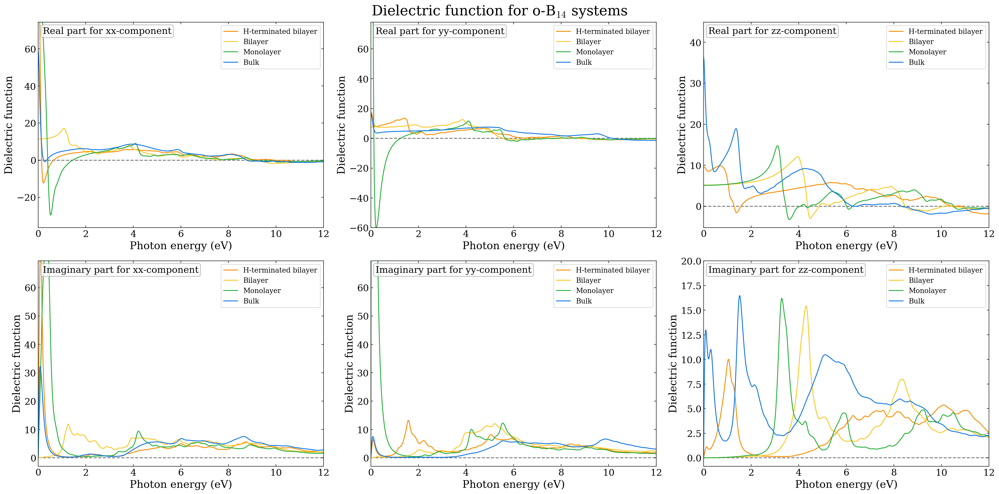

In [9]:
fig, axes = plt.subplots(2, 3, figsize=(24, 12))
for row, (kind, part) in enumerate([("real", "Real part"), ("imag", "Imaginary part")]):
    for col, component in enumerate(["xx", "yy", "zz"]):
        ax = axes[row, col]
        for folder, label, color, factor in SYSTEMS:
            energy, values = optics(folder, factor, kind)
            ax.plot(energy[energy <= 12], values[energy <= 12, col], color=color, label=label)
        low, high = ax.get_ylim()
        high = min(60, high)  # clip the large low-energy values
        ax.set(xlim=(0, 12), ylim=(max(-60, low), high) if kind == "real" else (-.05 * high, high))
        dielectric_panel(ax, f"{part} for {component}-component")
suptitle(fig, "Dielectric function for o-B$_{14}$ systems")
save(fig, "fig2.10.pdf")

### fig2.11–12 — Absorption, energy loss, reflectivity and refractive index

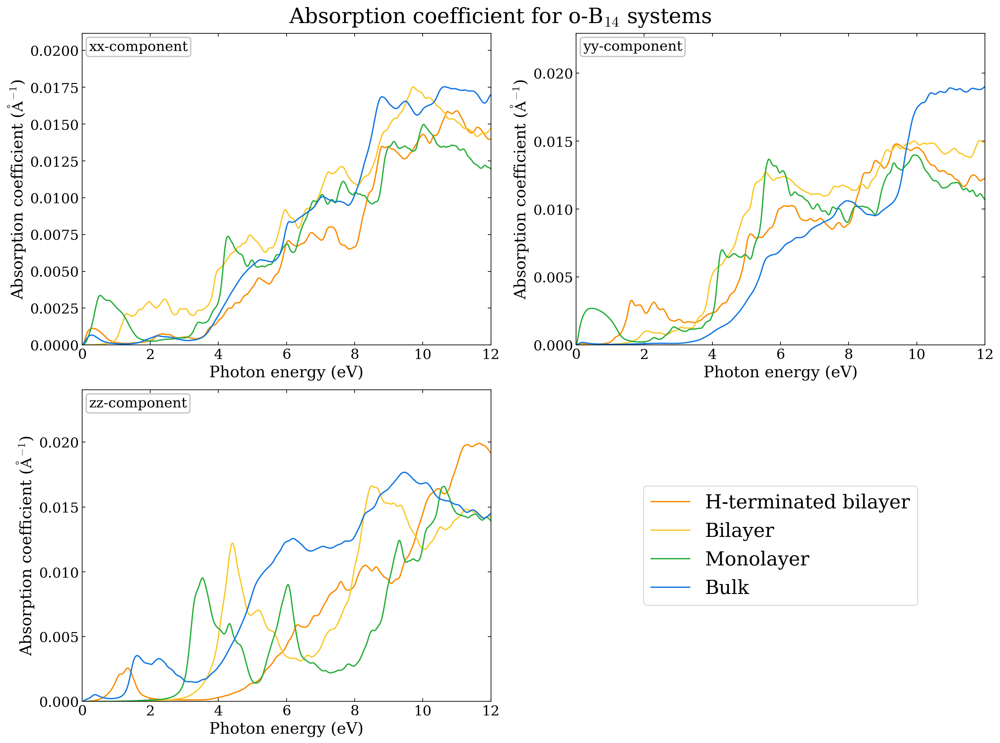

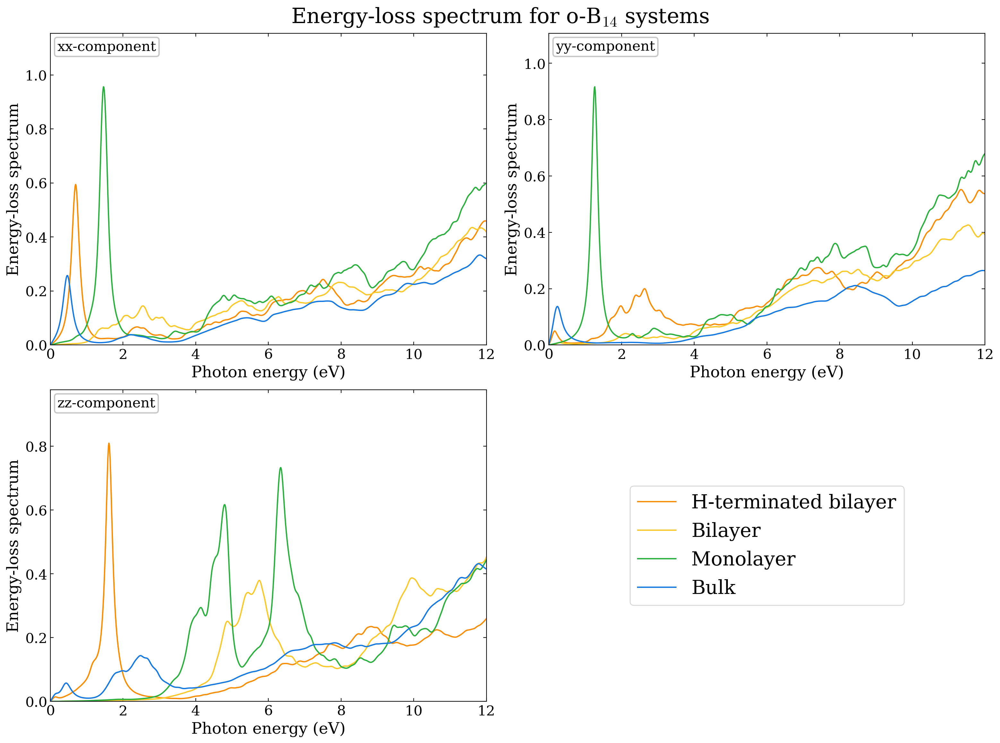

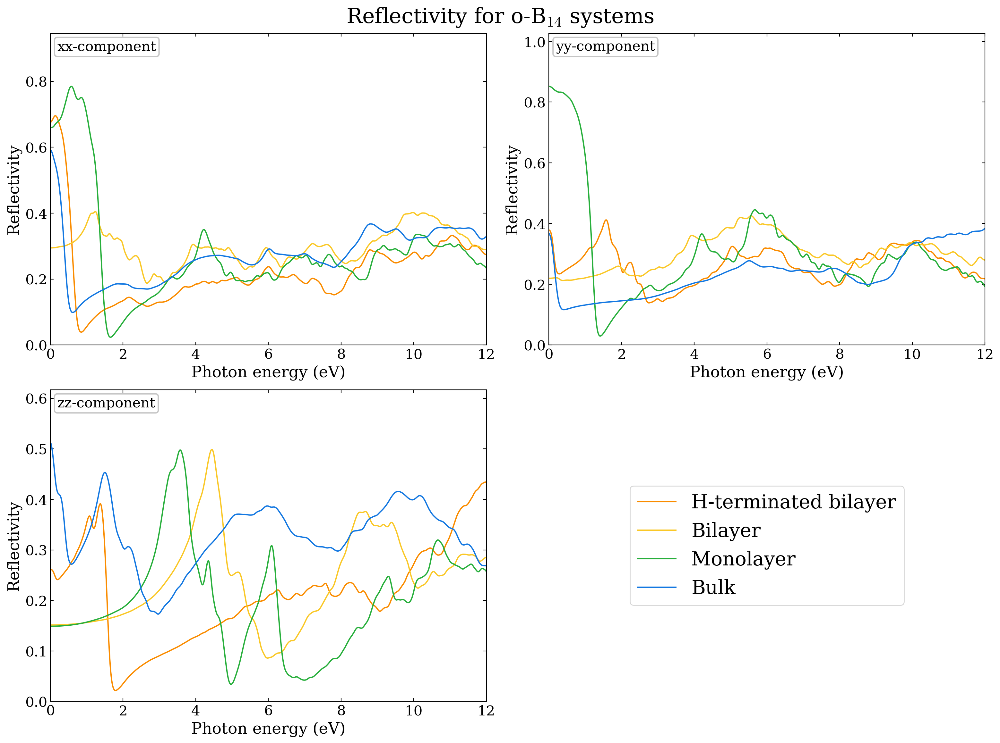

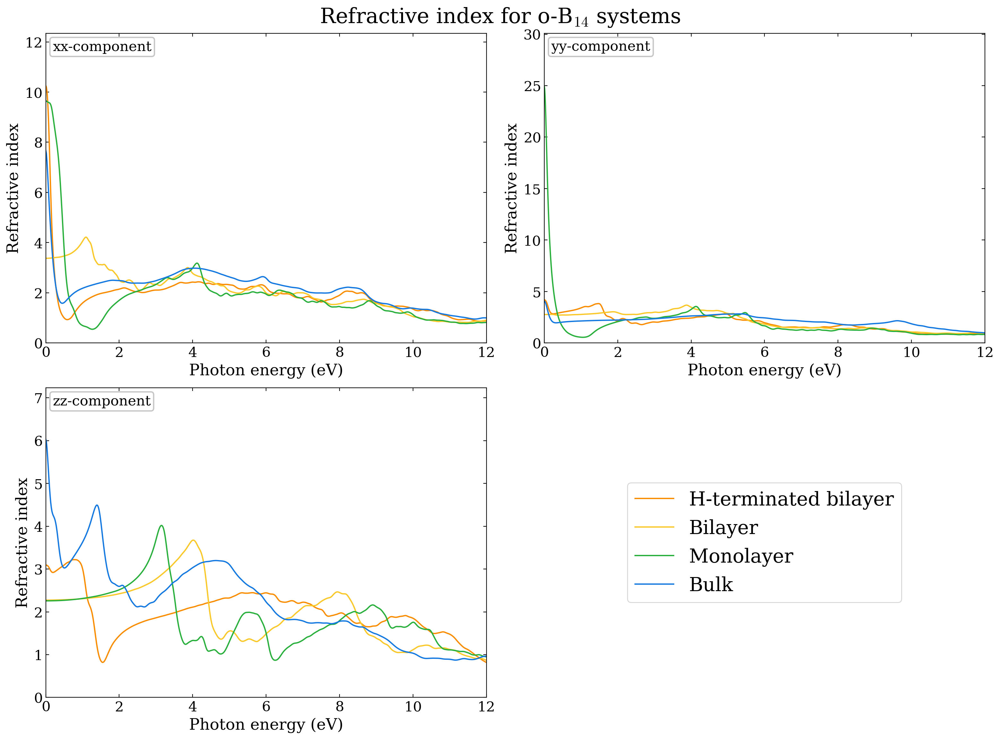

In [10]:
for name, kind in [("fig2.11a.pdf", "alpha"), ("fig2.11b.pdf", "loss"), ("fig2.12a.pdf", "R"), ("fig2.12b.pdf", "n")]:
    optical(name, kind)

### S2.18 — Extinction coefficient

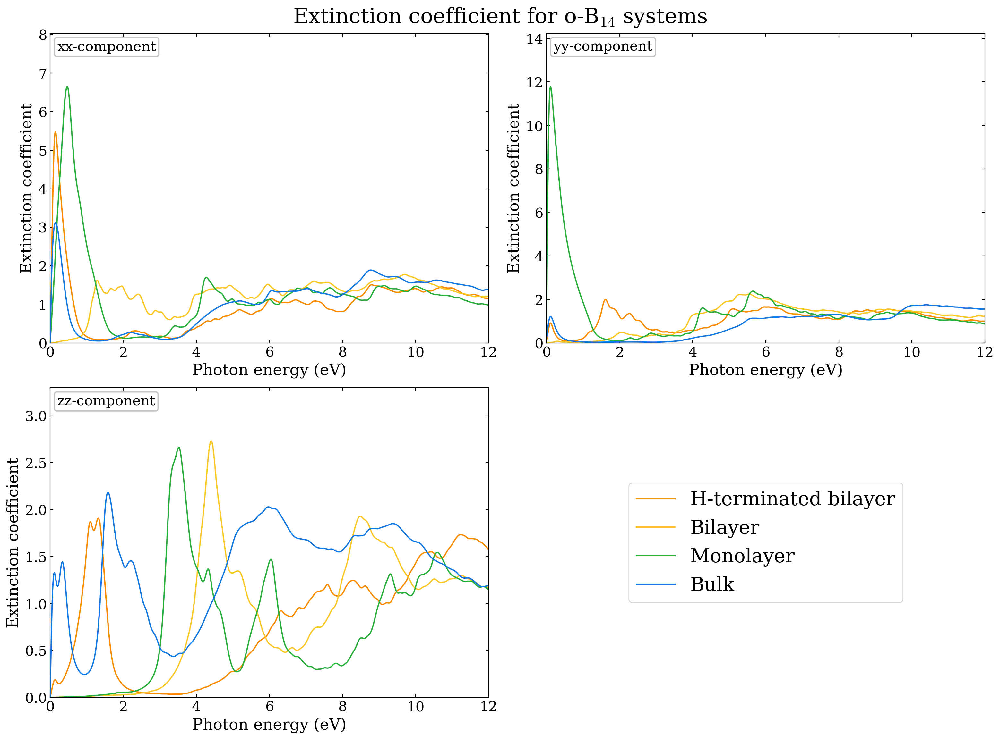

In [11]:
optical("S2.18.pdf", "k")

### S2.4–5 — Dielectric-function convergence

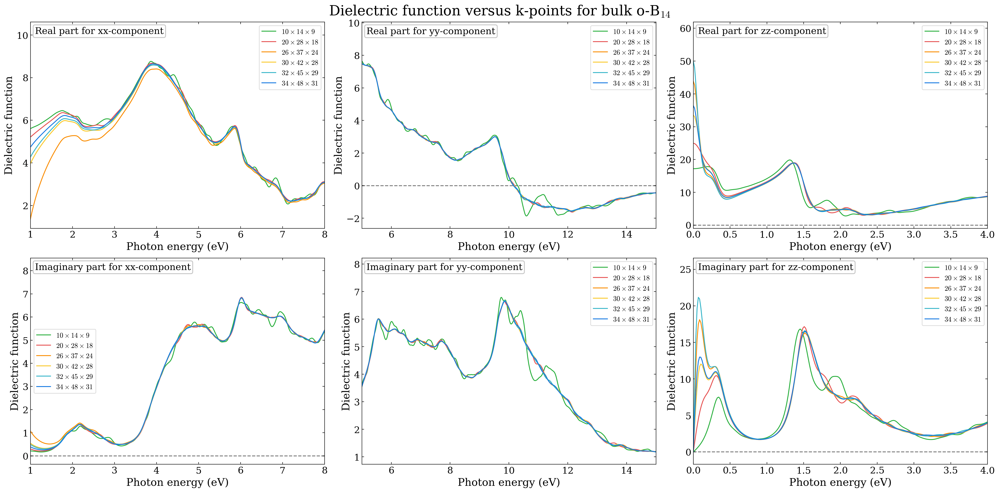

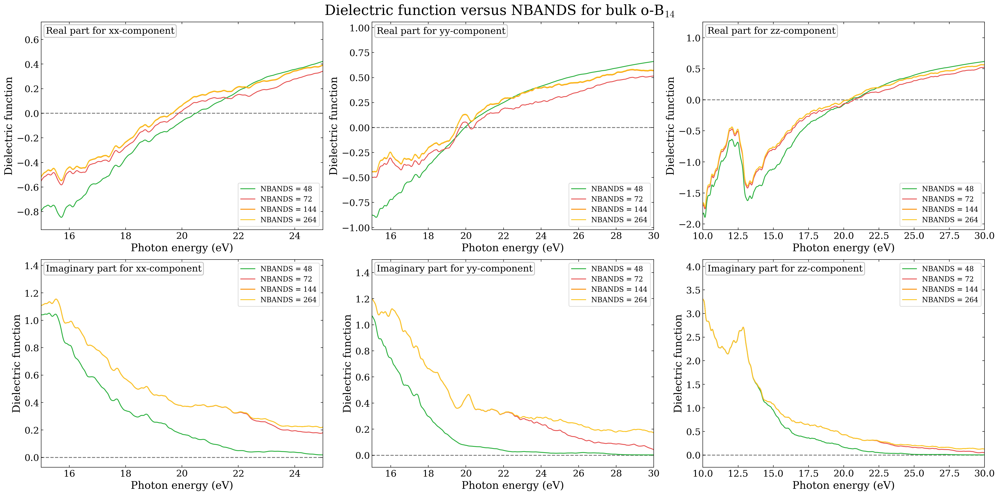

In [12]:
for name, folders, labels, windows, heading in [
    ("S2.4.pdf", [f"o-B14_n128_k{k}" for k in (10, 20, 26, 30, 32, 34)],
     [r"$10\times14\times9$", r"$20\times28\times18$", r"$26\times37\times24$", r"$30\times42\times28$", r"$32\times45\times29$", r"$34\times48\times31$"],
     [(1, 8), (5, 15), (0, 4)], "Dielectric function versus k-points for bulk o-B$_{14}$"),
    ("S2.5.pdf", [f"o-B14_n{n}_k10" for n in (32, 64, 128, 256)], [f"NBANDS = {n}" for n in (48, 72, 144, 264)],  # actual OUTCAR NBANDS
     [(15, 25), (15, 30), (10, 30)], "Dielectric function versus NBANDS for bulk o-B$_{14}$"),
]:
    fig, axes = plt.subplots(2, 3, figsize=(24, 12))
    for row, (kind, part) in enumerate([("real", "Real part"), ("imag", "Imaginary part")]):
        for col, (component, (low, high)) in enumerate(zip(["xx", "yy", "zz"], windows)):
            ax = axes[row, col]
            shown = []
            for folder, label, color in zip(folders, labels, [GREEN, "#E65050", ORANGE, YELLOW, CYAN, BLUE]):
                energy, values = optics(folder, 1., kind)
                ax.plot(energy, values[:, col], color=color, label=label)
                shown.append(values[(energy >= low) & (energy <= high), col])
            bottom, top = min(map(np.min, shown)), max(map(np.max, shown))
            ax.set(xlim=(low, high), ylim=(bottom - .08 * (top - bottom), top + .08 * (top - bottom)))
            dielectric_panel(ax, f"{part} for {component}-component", loc="best")
    suptitle(fig, heading)
    save(fig, name)

### S2.9 — Phonon dispersion with 3×3 supercells

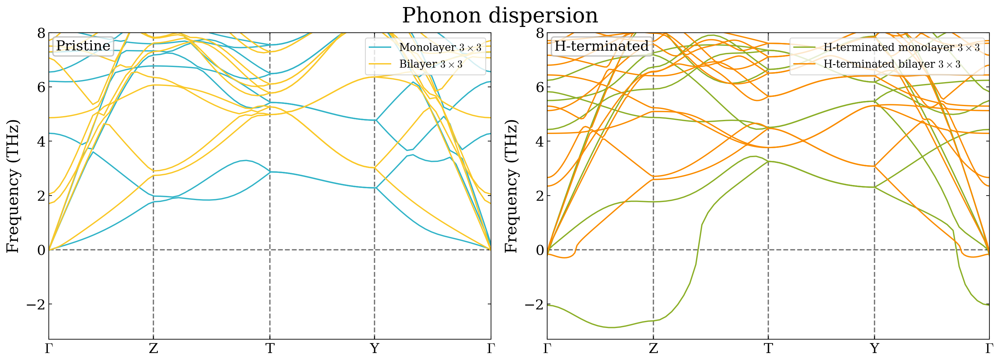

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, group, heading in zip(axes, [PRISTINE, HYDROGEN], ["Pristine", "H-terminated"]):
    draw_phonon(ax, [(folder, label + r" $3\times3$", color) for folder, label, color in group])
    ax.set_ylim(-3.3, 8)
    title(ax, heading)
    ax.legend(loc="upper right")
suptitle(fig, "Phonon dispersion")
save(fig, "S2.9.pdf")

### fig2.5, S2.8 — Phonon dispersion

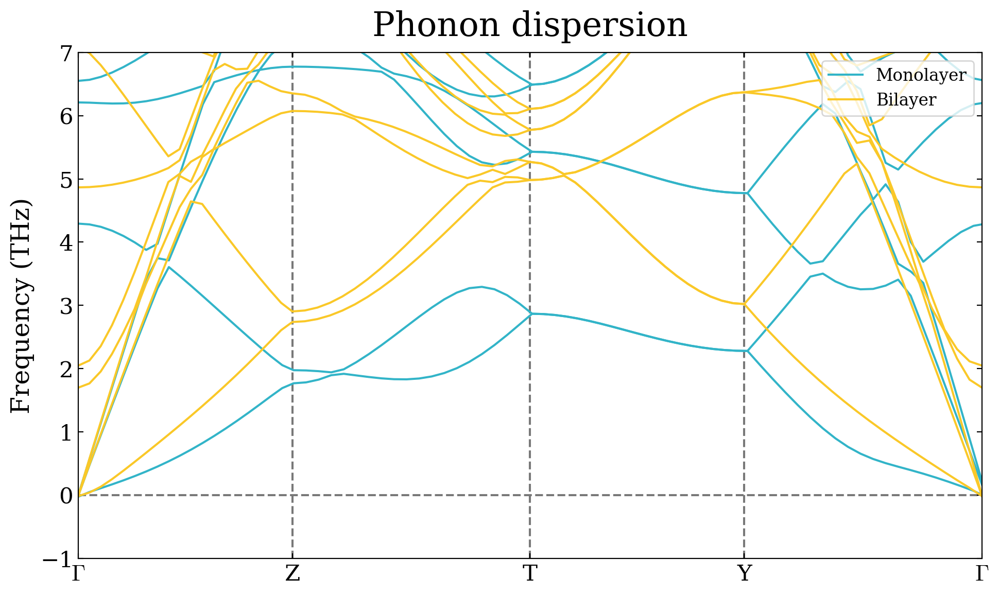

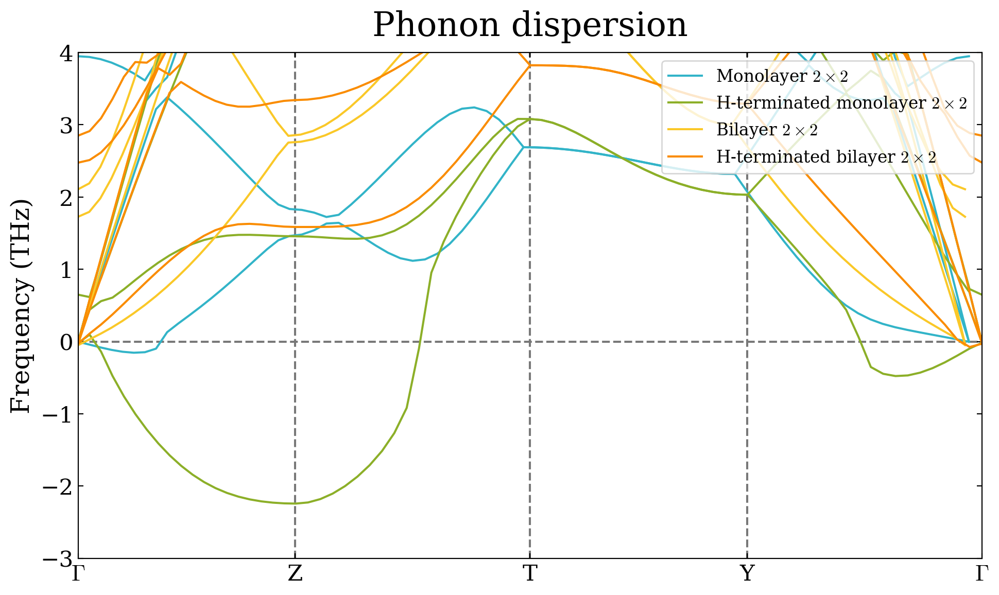

In [14]:
for name, group, ylim in [
    ("fig2.5.pdf", PRISTINE, (-1, 7)),
    ("S2.8.pdf", [(f"3.0_phonon_dispersion_vasp/{folder}", label + r" $2\times2$", color) for folder, label, color in [
        ("monolayer_2", "Monolayer", CYAN), ("monolayer_H_2", "H-terminated monolayer", OLIVE),
        ("bilayer_2", "Bilayer", YELLOW), ("bilayer_H_2", "H-terminated bilayer", ORANGE)]], (-3, 4)),
]:
    fig, ax = plt.subplots(figsize=(10, 6))
    draw_phonon(ax, group)
    ax.set(ylim=ylim, title="Phonon dispersion")
    ax.legend(loc="upper right")
    fig.tight_layout()
    save(fig, name)

### fig2.9 — Superconducting gap distributions

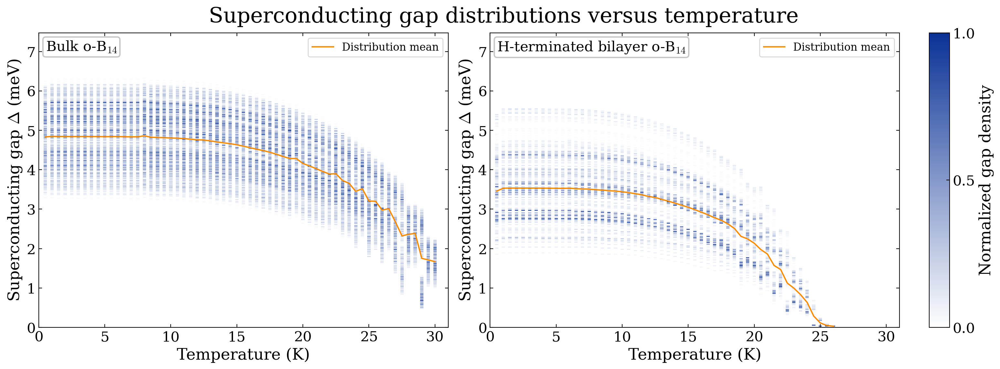

In [15]:
cmap = LinearSegmentedColormap.from_list("gap_density", ["white", "#0A3296"])
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, folder, heading in zip(axes, ["bulk", "bilayer_with_Hydrogen"], [r"Bulk o-B$_{14}$", r"H-terminated bilayer o-B$_{14}$"]):
    means = []
    for file in sorted((ROOT / "superconductivity" / folder).glob("B14.imag_aniso_gap0_*")):
        temperature = float(file.name.rsplit("_", 1)[1])
        data = np.loadtxt(file, ndmin=2)
        density, gap = data[:, 0] - temperature, data[:, 1]  # column 1 is T + rho/max(rho)
        points = ax.scatter(np.full(len(gap), temperature), gap, c=density, cmap=cmap, vmin=0, vmax=1, marker="_", s=14, linewidths=.9)
        means.append((temperature, np.average(gap, weights=density)))
    ax.plot(*np.array(means).T, color=ORANGE, label="Distribution mean")
    ax.set(xlim=(0, 31), ylim=(0, 6.5), xlabel="Temperature (K)", ylabel=r"Superconducting gap $\Delta$ (meV)")
    headroom(ax)
    title(ax, heading)
    ax.legend(loc="upper right")
suptitle(fig, "Superconducting gap distributions versus temperature", rect=(0, 0, .9, 1))
top, bottom = axes[1].get_position().y1, axes[1].get_position().y0
fig.colorbar(points, cax=fig.add_axes([.92, bottom, .02, top - bottom]), ticks=[0, .5, 1], label="Normalized gap density")
save(fig, "fig2.9.pdf")

### fig2.9 (alternative) — Superconducting gap distributions, EPW scatter

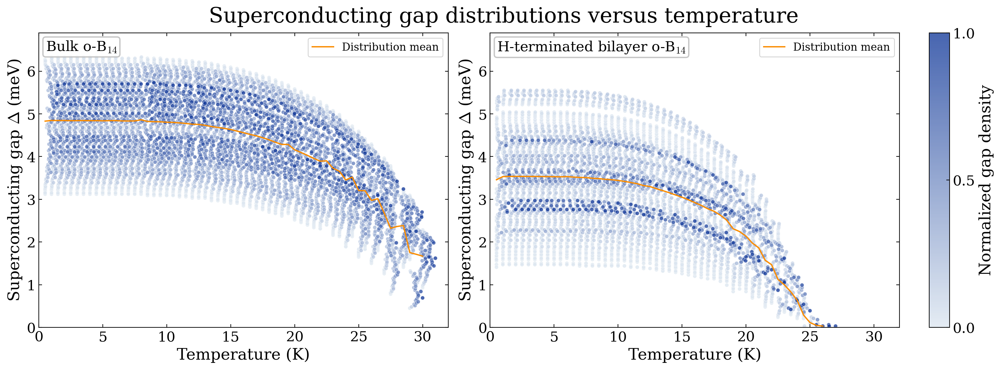

In [16]:
cmap = LinearSegmentedColormap.from_list("gap_density_alt", ["#DCE6F0", "#0A3296"])
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, folder, heading in zip(axes, ["bulk", "bilayer_with_Hydrogen"], [r"Bulk o-B$_{14}$", r"H-terminated bilayer o-B$_{14}$"]):
    rows, means = [], []
    for file in sorted((ROOT / "superconductivity" / folder).glob("B14.imag_aniso_gap0_*")):
        temperature = float(file.name.rsplit("_", 1)[1])
        data = np.loadtxt(file, ndmin=2)  # column 1 is T + rho/max(rho), plotted directly as in EPW
        density = data[:, 0] - temperature
        rows.append(np.column_stack([data, density]))
        means.append((temperature, np.average(data[:, 1], weights=density)))
    x, gap, density = np.concatenate(rows).T
    order = np.argsort(density)  # densest bins on top
    points = ax.scatter(x[order], gap[order], c=density[order], cmap=cmap, vmin=0, vmax=1,
                        s=20, alpha=.75, edgecolors="white", linewidths=.4)
    ax.plot(*np.array(means).T, color=ORANGE, label="Distribution mean")
    ax.set(xlim=(0, 32), ylim=(0, 6.0), xlabel="Temperature (K)", ylabel=r"Superconducting gap $\Delta$ (meV)")
    headroom(ax)
    title(ax, heading)
    ax.legend(loc="upper right")
suptitle(fig, "Superconducting gap distributions versus temperature", rect=(0, 0, .9, 1))
top, bottom = axes[1].get_position().y1, axes[1].get_position().y0
fig.colorbar(points, cax=fig.add_axes([.92, bottom, .02, top - bottom]), ticks=[0, .5, 1], label="Normalized gap density")
save(fig, "fig2.9_alt.pdf")

### S2.1 — Energy convergence and lattice scan

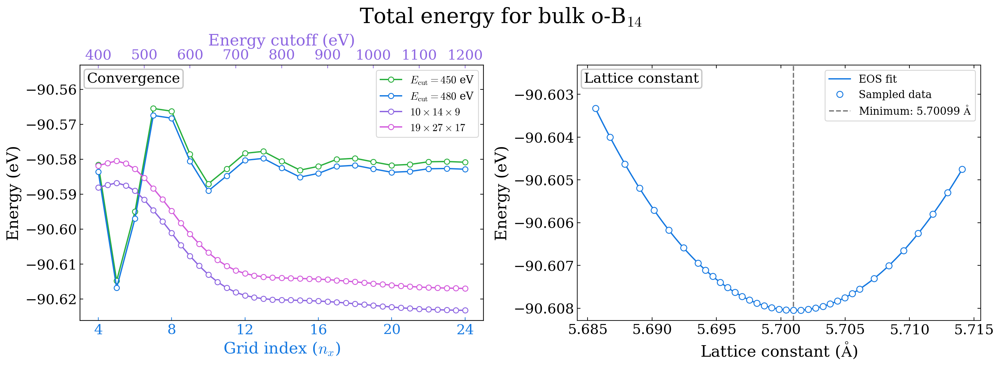

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
ax = axes[0]
upper = ax.twiny()  # plane-wave cutoff on the upper axis
for cutoff, color in [(450, GREEN), (480, BLUE)]:
    _, energy, rows = series(f"energy_kpoints_{cutoff}")
    ax.plot(mesh_index(rows), energy, "o-", color=color, mfc="white", label=rf"$E_{{\rm cut}}={cutoff}$ eV")
for grid, label, color in [("1260", r"$10\times14\times9$", VIOLET), ("8721", r"$19\times27\times17$", "#D25ADC")]:
    cutoff, energy, _ = series(f"energy_encut_{grid}", "energy cutoff (encut)", lower=400)
    upper.plot(cutoff, energy, "o-", color=color, mfc="white", label=label)
ax.set(xticks=[4, 8, 12, 16, 20, 24], ylabel="Energy (eV)")
ax.set_xlabel(r"Grid index ($n_x$)", color=BLUE)
ax.tick_params(axis="x", colors=BLUE)
upper.set_xlabel("Energy cutoff (eV)", color=VIOLET)
upper.tick_params(axis="x", colors=VIOLET)
ax.ticklabel_format(axis="y", style="plain", useOffset=False)
headroom(ax)
title(ax, "Convergence")
ax.legend(ax.get_lines() + upper.get_lines(), [line.get_label() for line in ax.get_lines() + upper.get_lines()], loc="upper right")

ax = axes[1]
lattice, energy, _ = series("energy_lattice", "lattice constant", lower=0)
_, xx, yy = fit_birch_murnaghan(lattice, energy, sample_count=100)
j = np.argmin(energy)
ax.plot(xx, yy, color=BLUE, label="EOS fit")
ax.plot(lattice, energy, "o", color=BLUE, mfc="white", ms=7, label="Sampled data")
ax.axvline(lattice[j], color=GREY, ls="--", zorder=0, label=rf"Minimum: {lattice[j]:.5f} $\mathrm{{\AA}}$")
ax.set(xlabel=r"Lattice constant ($\mathrm{\AA}$)", ylabel="Energy (eV)")
ax.ticklabel_format(axis="both", style="plain", useOffset=False)
headroom(ax)
title(ax, "Lattice constant")
ax.legend(loc="upper right")
suptitle(fig, "Total energy for bulk o-B$_{14}$")
save(fig, "S2.1.pdf")

### S2.2 — Cohesive energy

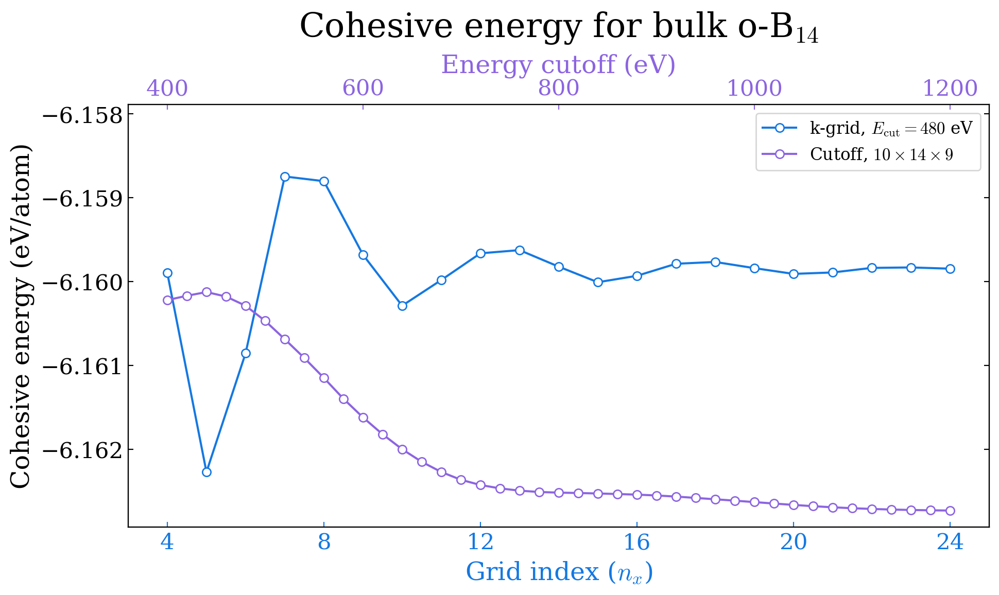

In [18]:
fig, ax = plt.subplots(figsize=(10, 6))
upper = ax.twiny()  # plane-wave cutoff on the upper axis
for axis, folder, xkey, color, lower, label in [
    (ax, "energy_kpoints_480", "total kpoints", BLUE, 40, r"k-grid, $E_{\rm cut}=480$ eV"),
    (upper, "energy_encut_1260", "energy cutoff (encut)", VIOLET, 400, r"Cutoff, $10\times14\times9$"),
]:
    ykey = next(k for k in table(f"1.0_energy/o-B14/{folder}/cohesive_energy.dat")[0] if "cohesive" in k)
    x, y, rows = series(folder, xkey, ykey, lower, "cohesive_energy.dat")
    axis.plot(mesh_index(rows) if axis is ax else x, y, "o-", color=color, mfc="white", label=label)
ax.set(xticks=[4, 8, 12, 16, 20, 24], ylabel="Cohesive energy (eV/atom)", title="Cohesive energy for bulk o-B$_{14}$")
ax.set_xlabel(r"Grid index ($n_x$)", color=BLUE)
ax.tick_params(axis="x", colors=BLUE)
upper.set_xticks([400, 600, 800, 1000, 1200])
upper.set_xlabel("Energy cutoff (eV)", color=VIOLET)
upper.tick_params(axis="x", colors=VIOLET)
ax.ticklabel_format(axis="y", style="plain", useOffset=False)
headroom(ax)
ax.legend(ax.get_lines() + upper.get_lines(), [line.get_label() for line in ax.get_lines() + upper.get_lines()], loc="upper right")
fig.tight_layout()
save(fig, "S2.2.pdf")

### S2.3 — Supercell height

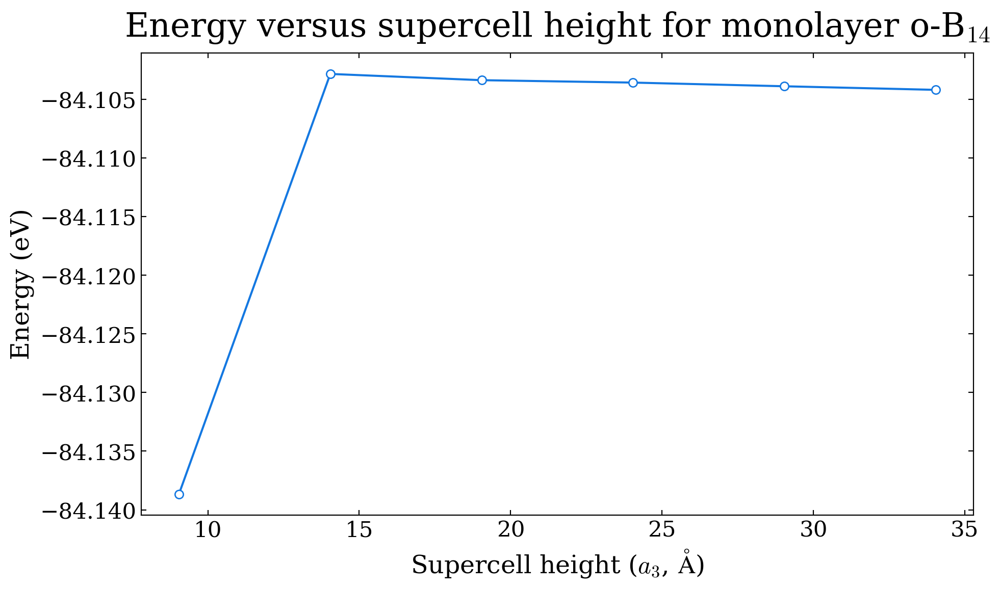

In [19]:
rows = table("2.1_geometry_optimization/monolayer/energy_vacuum/energy_parameters.dat")
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot([float(r["a3"]) for r in rows], [float(r["total energy"]) for r in rows], "o-", color=BLUE, mfc="white")
ax.set(xlabel=r"Supercell height ($a_3$, $\mathrm{\AA}$)", ylabel="Energy (eV)", title="Energy versus supercell height for monolayer o-B$_{14}$")
ax.ticklabel_format(axis="y", style="plain", useOffset=False)
fig.tight_layout()
save(fig, "S2.3.pdf")

### S2.15 — Fixed-spin energy

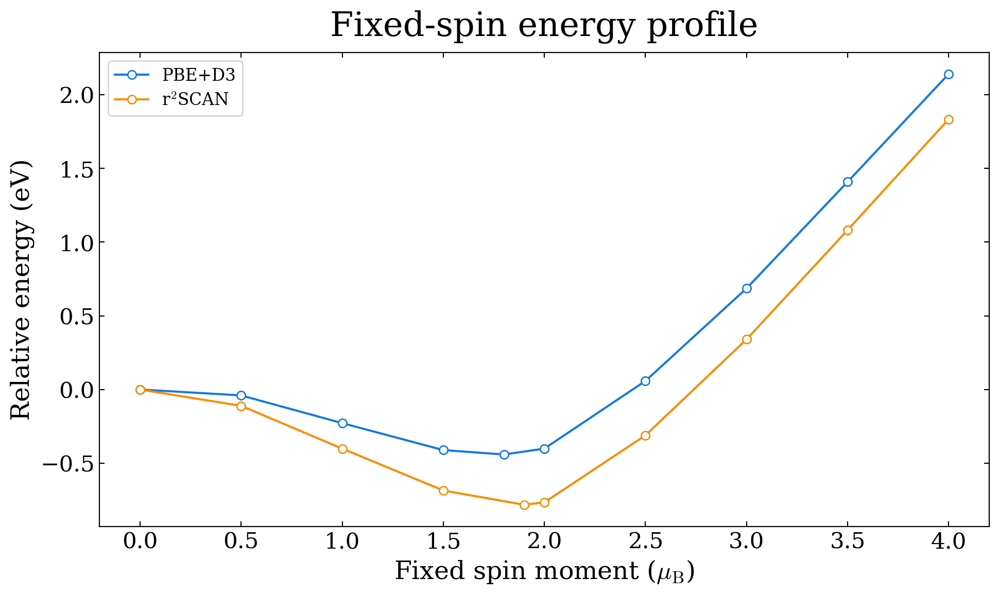

In [20]:
with open(HERE / "fixed_spin_data.csv") as f:  # tabulated source of the thesis fixed-spin figure
    rows = list(csv.DictReader(f))
fig, ax = plt.subplots(figsize=(10, 6))
for method, color, label in [("PBE+D3", BLUE, "PBE+D3"), ("r2SCAN", ORANGE, r"r$^2$SCAN")]:
    selected = [r for r in rows if r["method"] == method]
    ax.plot([float(r["fixed_spin_muB"]) for r in selected], [float(r["relative_energy_eV"]) for r in selected],
            "o-", color=color, mfc="white", label=label)
ax.set(xlabel=r"Fixed spin moment ($\mu_{\mathrm{B}}$)", ylabel="Relative energy (eV)", title="Fixed-spin energy profile")
ax.legend(loc="upper left")
fig.tight_layout()
save(fig, "S2.15.pdf")

### fig2.2 — Electronic structure of bulk o-B$_{14}$

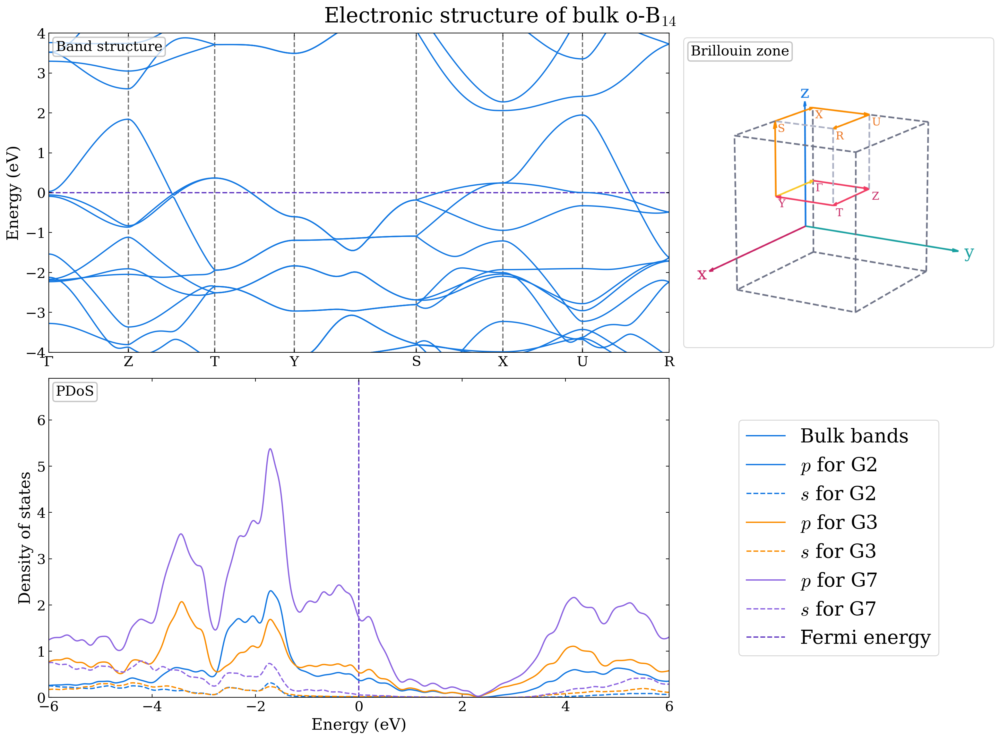

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12), gridspec_kw={"width_ratios": [2, 1]})
draw_bands(axes[0, 0], "o-B14_K48")
axes[0, 0].set(ylim=(-4, 4), ylabel="Energy (eV)")
title(axes[0, 0], "Band structure")

with fitz.open(ROOT / "kpath_tide.pdf") as pdf:
    pixmap = pdf[0].get_pixmap(matrix=fitz.Matrix(3, 3), alpha=False)
axes[0, 1].imshow(np.frombuffer(pixmap.samples, np.uint8).reshape(pixmap.height, pixmap.width, 3))
axes[0, 1].set(xticks=[], yticks=[])
legend_frame(axes[0, 1], size=22)  # matches the shared legend
title(axes[0, 1], "Brillouin zone")

section = ET.parse(ROOT / "4.1_PDoS/o-B14_K20/vasprun.xml").getroot().find(".//dos")
pdos = np.array([[r.text.split() for r in ion.findall("./set/r")] for ion in section.findall("./partial/array/set/set")], float)
energy = pdos[0, :, 0] - float(section.find("i[@name='efermi']").text)
ax = axes[1, 0]
for group, atoms, color in [(2, range(4, 8), BLUE), (3, [0, 1, 2, 3, 12, 13], ORANGE), (7, range(14), VIOLET)]:
    values = pdos[list(atoms)].sum(axis=0)  # columns: energy, s, py, pz, px, ...
    ax.plot(energy, values[:, 2:5].sum(axis=1), color=color, label=rf"$p$ for G{group}")
    ax.plot(energy, values[:, 1], color=color, ls="--", label=rf"$s$ for G{group}")
ax.axvline(0, color=FERMI, ls="--", zorder=0, label="Fermi energy")
ax.set(xlim=(-6, 6), ylim=(0, 6), xlabel="Energy (eV)", ylabel="Density of states")
headroom(ax)
title(ax, "PDoS")

axes[1, 1].axis("off")  # shared legend in the empty fourth cell
axes[1, 1].legend(handles=[Line2D([], [], color=BLUE, label="Bulk bands")] + ax.get_legend_handles_labels()[0], loc="center", fontsize=22)
suptitle(fig, "Electronic structure of bulk o-B$_{14}$")
save(fig, "fig2.2.pdf")

### S2.10 — AIMD of the H-terminated bilayer

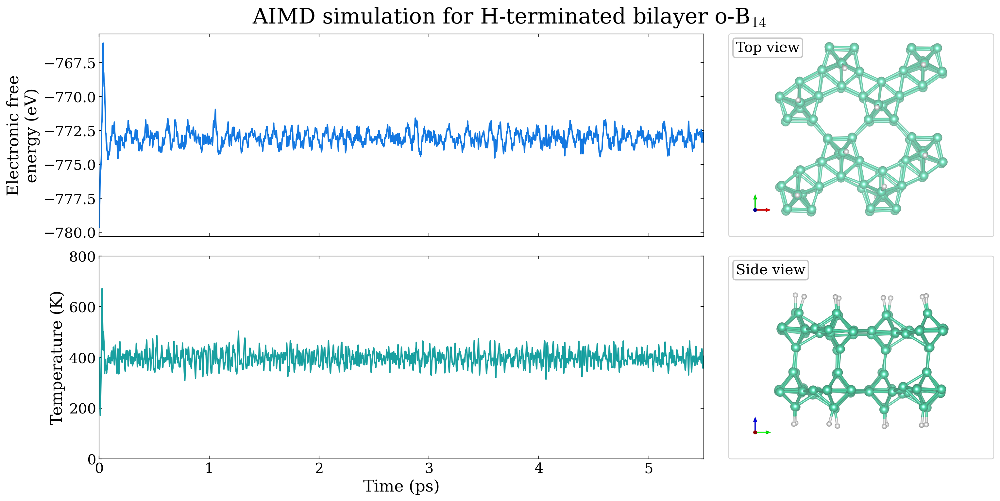

In [33]:
steps = [re.search(r"^\s*(\d+)\s+T=\s*([\d.Ee+\-]+).*?F=\s*([\d.Ee+\-]+)", line)
         for line in (ROOT / "6.0_AIMD/bilayer_H/OSZICAR").read_text().splitlines()]
step, temperature, energy = np.array([[float(x) for x in m.groups()] for m in steps if m]).T

fig = plt.figure(figsize=(16, 8))
grid = fig.add_gridspec(2, 2, width_ratios=[2, 1])
top = fig.add_subplot(grid[0, 0])
bottom = fig.add_subplot(grid[1, 0], sharex=top)
top.plot(step / 1000, energy, color=BLUE)
bottom.plot(step / 1000, temperature, color="#19A0A0")
top.set(xlim=(0, 5.5), ylabel="Electronic free\nenergy (eV)")
top.tick_params(labelbottom=False)
bottom.set(ylim=(0, 800), xlabel="Time (ps)", ylabel="Temperature (K)")
for row, filename, heading in [(0, "S2.10b1.png", "Top view"), (1, "S2.10b2.png", "Side view")]:
    ax = fig.add_subplot(grid[row, 1])
    ax.imshow(plt.imread(ROOT / "figures_collection" / filename))
    ax.set(xticks=[], yticks=[])
    legend_frame(ax)
    title(ax, heading)
suptitle(fig, "AIMD simulation for H-terminated bilayer o-B$_{14}$")
save(fig, "S2.10.pdf")